# <div class="alert" style="background:#404241; color:white; padding:5px 10px; border-radius:10px; max-width: 100%;"><h1 style='margin:5px 2px;font-size: 35px; text-align:center'> Communes d’Île-de-France </h1>
</div>


**Problem Statement**



In order to help the public authorities to better orient their decisions, you are asking to show whether there are classes of municipalities with similar characteristics. We will thus obtain a typology of the municipalities of Île-de-France and we will be able to represent these groups visually. The data we use are data on the municipalities of Île-de-France and their socio-demographic characteristics.


**Business Goal**


Our job is to categorise the region using some sociodemography

**Below are the steps which we will be basically following:** <br>

> **1. Step 1: Reading and Understanding the Data**
> 
> **2. Step 2: Data Cleansing**
> * Missing Value check
> * Data type check
> * Duplicate check
> 
> **3. Step 3: Data Visualization**
> * Outlier Analysis and Treatment
> * Heatmap
> * Pairplot
> 
> **4. Step 4: Data Preparation**
> * Rescaling
> 
> **5. Step 5: PCA Application**
> * Principal Components Selection
> 
> **6. Step 6: Model Building**
> * K-means Clustering
> * Elbow Curve
> * Silhouette Analysis
> * Hierarchial Clustering
> 
> **7. Step 7: Final Analysis**
> * Visualization in a Map



In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import folium 


# import all libraries and dependencies for machine learning
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA


# import all libraries and dependencies for clustering
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram




# Step 1: Reading and Understanding the Data

In [2]:
# Reading the file on which analysis needs to be done

dataset = pd.read_csv("/kaggle/input/basecomparateurdeterritoires/base-comparateur-de-territoires.csv" , sep=";")
dataset.head()

,CODGEO,LIBGEO,REG,DEP,P14_POP,P09_POP,SUPERF,NAIS0914,DECE0914,P14_MEN,...,ETAZ15,ETBE15,ETFZ15,ETGU15,ETGZ15,ETOQ15,ETTEF115,ETTEFP1015,Geo Shape,geo_point_2d
0,95555,Saint-Gratien,11,95,20996.0,20258.0,2.42,1564.0,749.0,8909.817815,...,3.0,38.0,142.0,1078.0,225.0,214.0,335.0,67.0,"{""type"": ""Polygon"", ""coordinates"": [[[2.274621...","48.9695044801, 2.28470111182"
1,95488,Pierrelaye,11,95,8155.0,7920.0,9.21,639.0,243.0,2891.000000,...,8.0,47.0,135.0,623.0,241.0,65.0,228.0,72.0,"{""type"": ""Polygon"", ""coordinates"": [[[2.193617...","49.0190794714, 2.1606870483"
2,95543,Saint-Cyr-en-Arthies,11,95,242.0,229.0,3.89,9.0,4.0,93.154812,...,2.0,0.0,2.0,5.0,2.0,4.0,4.0,0.0,"{""type"": ""Polygon"", ""coordinates"": [[[1.732068...","49.058878265, 1.74176317637"
3,95523,La Roche-Guyon,11,95,446.0,447.0,4.61,18.0,21.0,186.507593,...,0.0,6.0,6.0,48.0,17.0,14.0,13.0,4.0,"{""type"": ""Polygon"", ""coordinates"": [[[1.623323...","49.0883415268, 1.63442788467"
4,95678,Villiers-Adam,11,95,838.0,828.0,9.82,45.0,29.0,340.831981,...,6.0,3.0,8.0,53.0,12.0,5.0,14.0,2.0,"{""type"": ""Polygon"", ""coordinates"": [[[2.236020...","49.0697597649, 2.23847351378"


In [3]:
dataset["Geo Shape"][0]

'{"type": "Polygon", "coordinates": [[[2.2746219582, 48.9641395799], [2.2746750289, 48.9649366539], [2.273898382, 48.9697915954], [2.2718114758, 48.9738723921], [2.2716464045, 48.9748318015], [2.2734206536, 48.9767058298], [2.2737103447, 48.9766023708], [2.2738431139, 48.9767794295], [2.2742296031, 48.9765920248], [2.2759375414, 48.9757840203], [2.2770969284, 48.9760095334], [2.2792135565, 48.9764602104], [2.2825916352, 48.9772700109], [2.2842638623, 48.9773609337], [2.2902150728, 48.9772281347], [2.2918541908, 48.9762405458], [2.2919906586, 48.9761505263], [2.2928787397, 48.9762411944], [2.2950626295, 48.9763763479], [2.2969745244, 48.9760179739], [2.2978629208, 48.9750744602], [2.2960199937, 48.9745798567], [2.2958155542, 48.9744446671], [2.2930195616, 48.9716126343], [2.2934991683, 48.9690885315], [2.2950701549, 48.9679647026], [2.2980050594, 48.9665727693], [2.2986199686, 48.9663488529], [2.2980055038, 48.9660341116], [2.2930943325, 48.963201346], [2.2893785699, 48.9598745643], [2.

In [4]:
dataset.shape

(1300, 38)

In [5]:
dataset.describe()

,CODGEO,REG,DEP,P14_POP,P09_POP,SUPERF,NAIS0914,DECE0914,P14_MEN,NAISD16,...,P14_ACT1564,ETTOT15,ETAZ15,ETBE15,ETFZ15,ETGU15,ETGZ15,ETOQ15,ETTEF115,ETTEFP1015
count,1300.000000,1300.0,1300.000000,1297.000000,1297.000000,1297.000000,1297.000000,1297.000000,1297.000000,1296.00000,...,1297.000000,1299.000000,1299.000000,1299.000000,1299.000000,1299.000000,1299.000000,1299.000000,1299.000000,1299.000000
mean,83645.627692,11.0,83.365385,9273.373169,9042.590594,9.261581,701.562066,275.464919,3911.857733,137.33179,...,4693.056905,1074.360277,5.507313,35.343341,90.672055,822.943033,156.259430,119.894534,237.752887,59.829099
std,7740.687821,0.0,7.746337,21504.336745,21245.410301,7.744994,1683.059982,656.938707,10119.507537,328.70349,...,11262.165941,3943.692061,5.930172,109.156935,227.204178,3307.534583,459.451315,372.584596,885.241963,196.231503
min,75101.000000,11.0,75.000000,24.000000,28.000000,0.090000,0.000000,0.000000,12.000000,0.00000,...,13.440000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,77313.750000,11.0,77.000000,549.000000,541.000000,4.720000,28.000000,14.000000,208.787565,5.00000,...,280.049541,45.500000,2.000000,2.000000,6.000000,27.000000,6.000000,4.000000,9.000000,1.000000
50%,78310.500000,11.0,78.000000,1379.000000,1335.000000,7.650000,74.000000,39.000000,522.000000,14.00000,...,686.258374,116.000000,4.000000,6.000000,16.000000,74.000000,18.000000,13.000000,23.000000,5.000000
75%,91645.750000,11.0,91.000000,7059.000000,6840.000000,11.670000,415.000000,215.000000,2749.000000,81.00000,...,3481.316900,587.500000,7.000000,26.000000,65.000000,410.500000,98.500000,75.000000,125.500000,35.000000
max,95690.000000,11.0,95.000000,235366.000000,236491.000000,172.050000,16635.000000,7579.000000,125554.284324,3082.00000,...,127035.648749,65177.000000,87.000000,1377.000000,2515.000000,58871.000000,5517.000000,4629.000000,13888.000000,3537.000000


In [6]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300 entries, 0 to 1299
Data columns (total 38 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CODGEO         1300 non-null   int64  
 1   LIBGEO         1300 non-null   object 
 2   REG            1300 non-null   int64  
 3   DEP            1300 non-null   int64  
 4   P14_POP        1297 non-null   float64
 5   P09_POP        1297 non-null   float64
 6   SUPERF         1297 non-null   float64
 7   NAIS0914       1297 non-null   float64
 8   DECE0914       1297 non-null   float64
 9   P14_MEN        1297 non-null   float64
 10  NAISD16        1296 non-null   float64
 11  DECESD16       1296 non-null   float64
 12  P14_LOG        1297 non-null   float64
 13  P14_RP         1297 non-null   float64
 14  P14_RSECOCC    1297 non-null   float64
 15  P14_LOGVAC     1297 non-null   float64
 16  P14_RP_PROP    1297 non-null   float64
 17  NBMENFISC14    1280 non-null   float64
 18  PIMP14  

# Step 2 : Data Cleansing

In [7]:
# Calculating the Missing Values Pourcentage in columns
df_null = dataset.isna().mean()*100
df_null

CODGEO            0.000000
LIBGEO            0.000000
REG               0.000000
DEP               0.000000
P14_POP           0.230769
P09_POP           0.230769
SUPERF            0.230769
NAIS0914          0.230769
DECE0914          0.230769
P14_MEN           0.230769
NAISD16           0.307692
DECESD16          0.307692
P14_LOG           0.230769
P14_RP            0.230769
P14_RSECOCC       0.230769
P14_LOGVAC        0.230769
P14_RP_PROP       0.230769
NBMENFISC14       1.538462
PIMP14           56.846154
MED14             1.538462
TP6014           64.461538
P14_EMPLT         0.230769
P14_EMPLT_SAL     0.230769
P09_EMPLT         0.000000
P14_POP1564       0.230769
P14_CHOM1564      0.230769
P14_ACT1564       0.230769
ETTOT15           0.076923
ETAZ15            0.076923
ETBE15            0.076923
ETFZ15            0.076923
ETGU15            0.076923
ETGZ15            0.076923
ETOQ15            0.076923
ETTEF115          0.076923
ETTEFP1015        0.076923
Geo Shape         0.230769
g

In [8]:
dataset["TP6014"].head(20)

0     14.972881
1     14.387392
2           NaN
3           NaN
4           NaN
5           NaN
6           NaN
7           NaN
8           NaN
9           NaN
10          NaN
11    10.279673
12    18.958275
13          NaN
14          NaN
15     9.939180
16    20.553242
17          NaN
18     7.397510
19          NaN
Name: TP6014, dtype: float64

In [9]:
#droping TP6014 column beacuse it has minssing on 60-70 percent of it
dataset = dataset.drop(["TP6014"], axis = 1)

In [10]:
# Segregation of Numerical and Categorical Variables/Columns
cat_col = dataset.select_dtypes(include = ['object']).columns
num_col = dataset.select_dtypes(exclude = ['object']).columns

In [11]:
# replace the Nan values with the mean
for column in num_col:
    mean = int(dataset[column].mean(skipna=True))
    dataset[column] = dataset[column].replace(np.NaN, mean)

In [12]:
# Datatype check for the dataframe
dataset.dtypes

CODGEO             int64
LIBGEO            object
REG                int64
DEP                int64
P14_POP          float64
P09_POP          float64
SUPERF           float64
NAIS0914         float64
DECE0914         float64
P14_MEN          float64
NAISD16          float64
DECESD16         float64
P14_LOG          float64
P14_RP           float64
P14_RSECOCC      float64
P14_LOGVAC       float64
P14_RP_PROP      float64
NBMENFISC14      float64
PIMP14           float64
MED14            float64
P14_EMPLT        float64
P14_EMPLT_SAL    float64
P09_EMPLT        float64
P14_POP1564      float64
P14_CHOM1564     float64
P14_ACT1564      float64
ETTOT15          float64
ETAZ15           float64
ETBE15           float64
ETFZ15           float64
ETGU15           float64
ETGZ15           float64
ETOQ15           float64
ETTEF115         float64
ETTEFP1015       float64
Geo Shape         object
geo_point_2d      object
dtype: object

**Inference:**
* None of the columns have inconsistent datatype, hence no conversion is required.

In [13]:
# Duplicates check

dataset.loc[dataset.duplicated()]

,CODGEO,LIBGEO,REG,DEP,P14_POP,P09_POP,SUPERF,NAIS0914,DECE0914,P14_MEN,...,ETAZ15,ETBE15,ETFZ15,ETGU15,ETGZ15,ETOQ15,ETTEF115,ETTEFP1015,Geo Shape,geo_point_2d


In [14]:
dataset.head()

,CODGEO,LIBGEO,REG,DEP,P14_POP,P09_POP,SUPERF,NAIS0914,DECE0914,P14_MEN,...,ETAZ15,ETBE15,ETFZ15,ETGU15,ETGZ15,ETOQ15,ETTEF115,ETTEFP1015,Geo Shape,geo_point_2d
0,95555,Saint-Gratien,11,95,20996.0,20258.0,2.42,1564.0,749.0,8909.817815,...,3.0,38.0,142.0,1078.0,225.0,214.0,335.0,67.0,"{""type"": ""Polygon"", ""coordinates"": [[[2.274621...","48.9695044801, 2.28470111182"
1,95488,Pierrelaye,11,95,8155.0,7920.0,9.21,639.0,243.0,2891.000000,...,8.0,47.0,135.0,623.0,241.0,65.0,228.0,72.0,"{""type"": ""Polygon"", ""coordinates"": [[[2.193617...","49.0190794714, 2.1606870483"
2,95543,Saint-Cyr-en-Arthies,11,95,242.0,229.0,3.89,9.0,4.0,93.154812,...,2.0,0.0,2.0,5.0,2.0,4.0,4.0,0.0,"{""type"": ""Polygon"", ""coordinates"": [[[1.732068...","49.058878265, 1.74176317637"
3,95523,La Roche-Guyon,11,95,446.0,447.0,4.61,18.0,21.0,186.507593,...,0.0,6.0,6.0,48.0,17.0,14.0,13.0,4.0,"{""type"": ""Polygon"", ""coordinates"": [[[1.623323...","49.0883415268, 1.63442788467"
4,95678,Villiers-Adam,11,95,838.0,828.0,9.82,45.0,29.0,340.831981,...,6.0,3.0,8.0,53.0,12.0,5.0,14.0,2.0,"{""type"": ""Polygon"", ""coordinates"": [[[2.236020...","49.0697597649, 2.23847351378"


The dataset seems to be almost clean and hence no such cleansing activities are required.

In [15]:
# Split "geo_point_2d" so we can use it later.
dataset[['Latitude','Longitude']] = dataset['geo_point_2d'].str.split(',', 1, expand=True)
dataset.head()

,CODGEO,LIBGEO,REG,DEP,P14_POP,P09_POP,SUPERF,NAIS0914,DECE0914,P14_MEN,...,ETFZ15,ETGU15,ETGZ15,ETOQ15,ETTEF115,ETTEFP1015,Geo Shape,geo_point_2d,Latitude,Longitude
0,95555,Saint-Gratien,11,95,20996.0,20258.0,2.42,1564.0,749.0,8909.817815,...,142.0,1078.0,225.0,214.0,335.0,67.0,"{""type"": ""Polygon"", ""coordinates"": [[[2.274621...","48.9695044801, 2.28470111182",48.9695044801,2.28470111182
1,95488,Pierrelaye,11,95,8155.0,7920.0,9.21,639.0,243.0,2891.000000,...,135.0,623.0,241.0,65.0,228.0,72.0,"{""type"": ""Polygon"", ""coordinates"": [[[2.193617...","49.0190794714, 2.1606870483",49.0190794714,2.1606870483
2,95543,Saint-Cyr-en-Arthies,11,95,242.0,229.0,3.89,9.0,4.0,93.154812,...,2.0,5.0,2.0,4.0,4.0,0.0,"{""type"": ""Polygon"", ""coordinates"": [[[1.732068...","49.058878265, 1.74176317637",49.058878265,1.74176317637
3,95523,La Roche-Guyon,11,95,446.0,447.0,4.61,18.0,21.0,186.507593,...,6.0,48.0,17.0,14.0,13.0,4.0,"{""type"": ""Polygon"", ""coordinates"": [[[1.623323...","49.0883415268, 1.63442788467",49.0883415268,1.63442788467
4,95678,Villiers-Adam,11,95,838.0,828.0,9.82,45.0,29.0,340.831981,...,8.0,53.0,12.0,5.0,14.0,2.0,"{""type"": ""Polygon"", ""coordinates"": [[[2.236020...","49.0697597649, 2.23847351378",49.0697597649,2.23847351378


# Step 3 : Data Visualization

**Outlier Analysis and Treatment**
<br>
There are 2 types of outliers and we will treat outliers as it can skew our dataset¶

* Statistical
* Domain specific

In [16]:
# Droping de columns that will be no need to give it to the model
dataset_drop = dataset.drop(["CODGEO","geo_point_2d","LIBGEO","Geo Shape","Latitude","Longitude"], axis = 1)

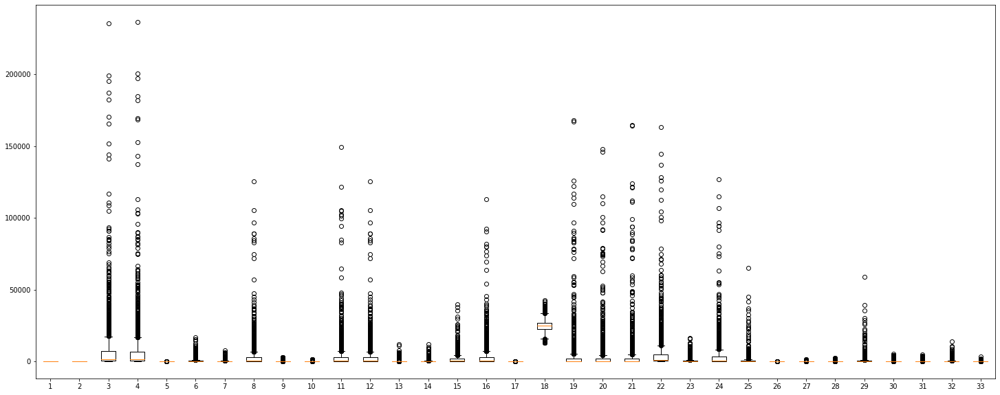

In [17]:
plt.figure(figsize=(25, 10))
plt.boxplot(dataset_drop);

In [18]:
for col in dataset_drop.columns:
  q25, q75 = np.percentile(dataset_drop[col].dropna(), 25), np.percentile(dataset_drop[col].dropna(), 75)
  iqr = q75 - q25
  upper_limit = q75 + 1.5 * iqr
  lower_limit = q25 - 1.5 * iqr
  dataset_drop[col] = np.where(
      dataset_drop[col] < lower_limit,
      lower_limit,
      np.where(
          dataset_drop[col] > upper_limit,
          upper_limit,
          dataset_drop[col]
      )
  )

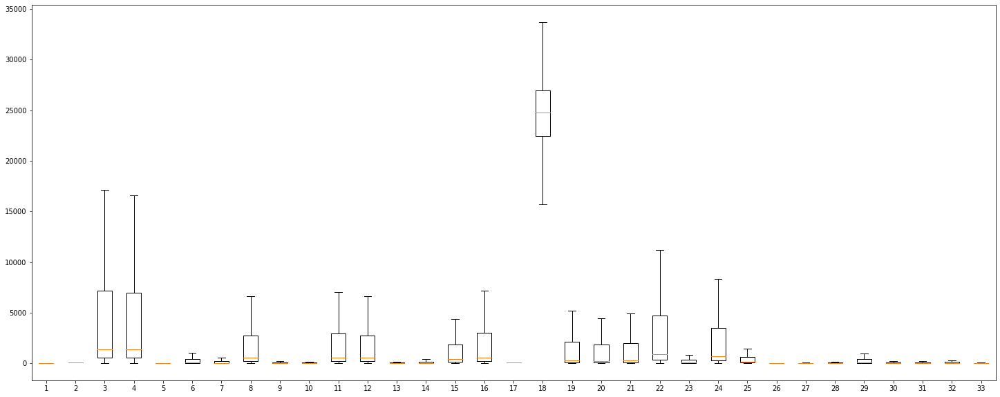

In [19]:
plt.figure(figsize=(25, 10))
plt.boxplot(dataset_drop);

**Corelation all numeric columns**

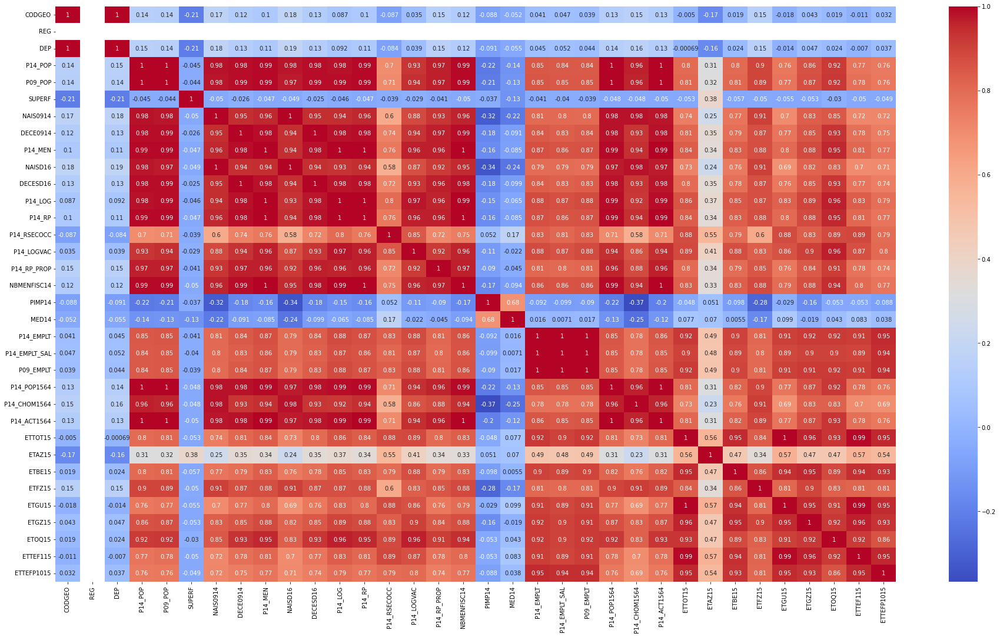

In [20]:
# Heatmap to understand the attributes dependency
plt.figure(figsize = (32,18))        
ax = sns.heatmap(dataset.corr(),annot = True, cmap="coolwarm")
# bottom, top = ax.get_ylim()
# ax.set_ylim(bottom + 0.5, top - 0.5)

**Inference:**
* **p14_pop** and **p14_mean** are highly correlated with correlation of 0.99
* **P14_CHOM1564** and **PIMP14** are highly correlated with correlation of -0.37
* **DECE0914** and **P14_RP_PROP** are highly correlated with correlation of 0.96
* **PIMP14** and **NAISD16** are highly correlated with correlation of -0.34

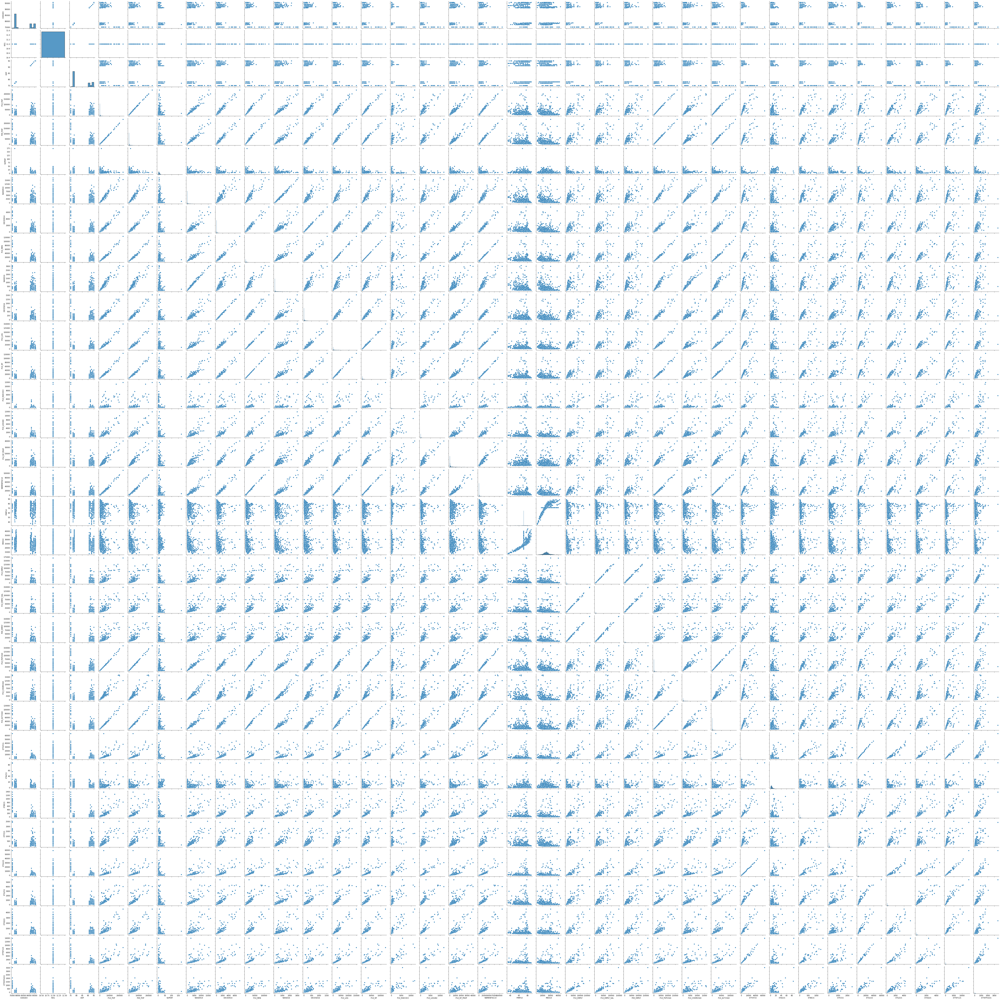

In [21]:
# Pairplot of all numeric columns
sns.pairplot(dataset)

# Step 4 : Data Preparation

In [22]:
dataset_drop.head()

,REG,DEP,P14_POP,P09_POP,SUPERF,NAIS0914,DECE0914,P14_MEN,NAISD16,DECESD16,...,P14_ACT1564,ETTOT15,ETAZ15,ETBE15,ETFZ15,ETGU15,ETGZ15,ETOQ15,ETTEF115,ETTEFP1015
0,11.0,95.0,17157.375,16607.25,2.42,1010.5,529.625,6605.401359,200.625,121.125,...,8348.464406,1407.0,3.0,38.0,142.0,990.75,225.00,182.125,302.125,67.0
1,11.0,95.0,8155.000,7920.00,9.21,639.0,243.000,2891.000000,152.000,46.000,...,4044.000000,878.0,8.0,47.0,135.0,623.00,239.75,65.000,228.000,72.0
2,11.0,95.0,242.000,229.00,3.89,9.0,4.000,93.154812,1.000,1.000,...,109.355649,13.0,2.0,0.0,2.0,5.00,2.00,4.000,4.000,0.0
3,11.0,95.0,446.000,447.00,4.61,18.0,21.000,186.507593,0.000,6.000,...,204.811694,74.0,0.0,6.0,6.0,48.00,17.00,14.000,13.000,4.0
4,11.0,95.0,838.000,828.00,9.82,45.0,29.000,340.831981,5.000,9.000,...,400.064890,75.0,6.0,3.0,8.0,53.00,12.00,5.000,14.000,2.0


In [23]:
dataset_drop.shape

(1300, 33)

**Rescaling the Features**
<br>
it's important to do standardisation/normalisation. There are two common ways of rescaling:

1. Min-Max scaling
1. Standardisation (mean-0, sigma-1)

Here, we will use Standardisation Scaling.

In [24]:
scaler = StandardScaler()
dataset_scaled = scaler.fit_transform(dataset_drop)

In [25]:
dataset_scaled

array([[ 0.        ,  1.50252869,  1.96635316, ...,  1.97323093,
         1.96379241,  1.37437711],
       [ 0.        ,  1.50252869,  0.52301643, ...,  0.21111407,
         1.29175218,  1.53118685],
       [ 0.        ,  1.50252869, -0.7456625 , ..., -0.70661595,
        -0.73910129, -0.72687348],
       ...,
       [ 0.        ,  1.50252869, -0.75608385, ..., -0.73670546,
        -0.69376974, -0.72687348],
       [ 0.        ,  1.50252869, -0.73989068, ..., -0.7216607 ,
        -0.68470343, -0.66414958],
       [ 0.        ,  1.50252869, -0.66293303, ..., -0.67652644,
        -0.64843819, -0.1623584 ]])

# Step 5 : PCA Application
We are doing PCA because we want to remove the redundancies in the data and find the most important directions where the data was aligned.

Principal component analysis (PCA) is one of the most commonly used dimensionality reduction techniques in the industry. By converting large data sets into smaller ones containing fewer variables, it helps in improving model performance, visualising complex data sets, and in many more areas.

Let's use PCA for dimensionality reduction as from the heatmap it is evident that correlation exists between the attributes.

In [26]:
pca = PCA(svd_solver='randomized', random_state=42)

In [27]:
pca.fit(dataset_scaled)

PCA(random_state=42, svd_solver='randomized')

Text(0, 0.5, 'Variance Ratio')

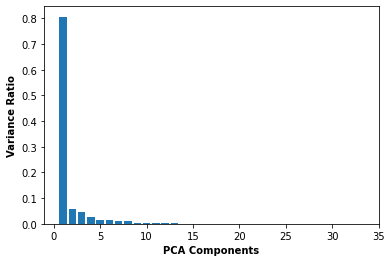

In [28]:
# Variance Ratio bar plot for each PCA components.

ax = plt.bar(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)
plt.xlabel("PCA Components",fontweight = 'bold')
plt.ylabel("Variance Ratio",fontweight = 'bold')

**Inference:**
* With first component variance explained is almost 80%.
* For second component variance explained is almost 8%.
* For  component variance explained is almost 2%.

Text(0, 0.5, 'Cumulative Explained Variance')

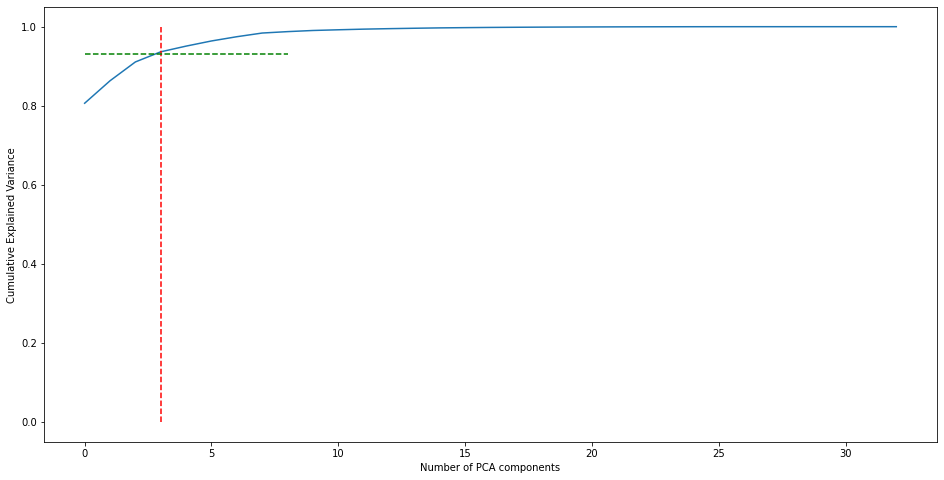

In [29]:
# Scree plot to visualize the Cumulative variance against the Number of components

fig = plt.figure(figsize = (16,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.vlines(x=3, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.93, xmax=8, xmin=0, colors="g", linestyles="--")
plt.xlabel('Number of PCA components')
plt.ylabel('Cumulative Explained Variance')

**Inference:**
It is evident from the above Scree plot that more than 92% variance is explained by the first 3 principal components. Hence, we will use these components only going forward for Clustering process.

In [30]:
# Checking which attributes are well explained by the pca components

commune_col = list(dataset_drop.columns)
attributes_pca = pd.DataFrame({'Attribute':commune_col,'PC_1':pca.components_[0],'PC_2':pca.components_[1],'PC_3':pca.components_[2]})

In [31]:
attributes_pca

,Attribute,PC_1,PC_2,PC_3
0,REG,-9.992007e-17,5.903559e-23,-2.371225e-23
1,DEP,6.200096e-02,-2.889340e-01,-1.722443e-01
2,P14_POP,1.957815e-01,-7.225476e-03,-3.038085e-03
3,P09_POP,1.955911e-01,-7.453550e-03,-9.606443e-04
4,SUPERF,-2.630817e-02,6.266453e-01,1.891210e-01
5,NAIS0914,1.942142e-01,-2.233340e-03,-4.122661e-02
6,DECE0914,1.919358e-01,1.957265e-02,9.804050e-03
7,P14_MEN,1.958970e-01,-7.246710e-03,3.376010e-03
8,NAISD16,1.933887e-01,-2.454326e-03,-4.723028e-02
9,DECESD16,1.917986e-01,1.810004e-02,9.658876e-03


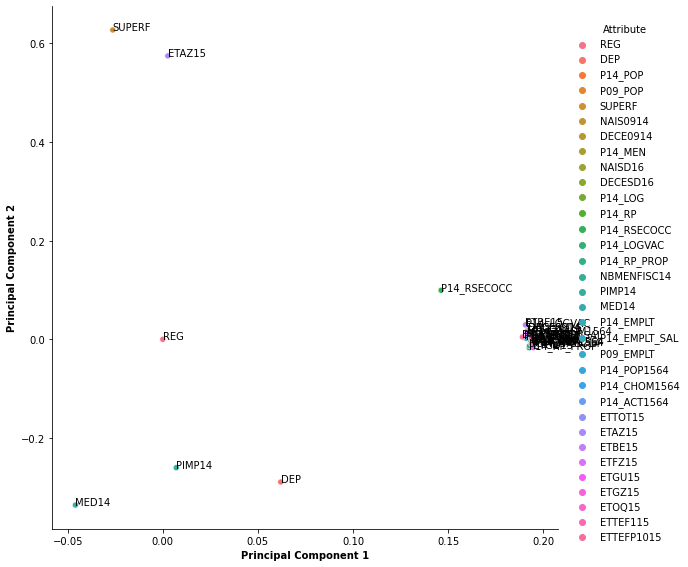

In [32]:
# Plotting the above dataframe for better visualization with PC1 and PC2

sns.pairplot(data=attributes_pca, x_vars=["PC_1"], y_vars=["PC_2"], hue = "Attribute" ,height=8)
plt.xlabel("Principal Component 1",fontweight = 'bold')
plt.ylabel("Principal Component 2",fontweight = 'bold')

for i,txt in enumerate(attributes_pca.Attribute):
    plt.annotate(txt, (attributes_pca.PC_1[i],attributes_pca.PC_2[i]))

**Inference:**
* ETPE15, ETOQ15, ETGZ15, P14_LOGVAC,P14_LOG and NAIS0914 well explained by PC1.
* P14_RESECOCC well explained by both the components PC1 and PC2.
* SUPERF and ETAZ15  are well explained by PC2.
* PIMP14 and MED14 are neither explained by PC1 nor with PC2

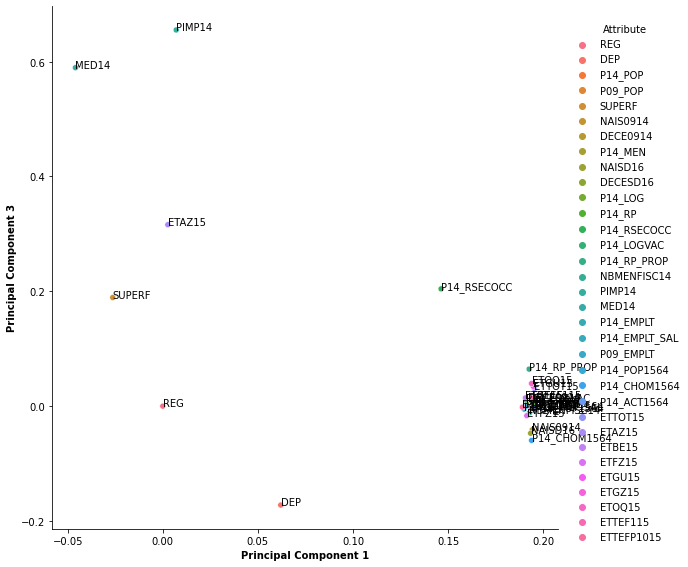

In [33]:
# Plotting the above dataframe with PC1 and PC3 to understand the components which explains inflation.

sns.pairplot(data=attributes_pca, x_vars=["PC_1"], y_vars=["PC_3"], hue = "Attribute" ,height=8)
plt.xlabel("Principal Component 1",fontweight = 'bold')
plt.ylabel("Principal Component 3",fontweight = 'bold')

for i,txt in enumerate(attributes_pca.Attribute):
    plt.annotate(txt, (attributes_pca.PC_1[i],attributes_pca.PC_3[i]))

**Inference:**
*  PIMP14 and MED14 are is well explained by PC3.

Since 92% variance is explained by 3 principal components, lets build the dataframe using those 3 components only

In [34]:
# Building the dataframe using Incremental PCA for better efficiency.

inc_pca = IncrementalPCA(n_components=3)

**Incremental principal component analysis (IPCA)** is typically used as a replacement for principal component analysis (PCA) when the dataset to be decomposed is too large to fit in memory. ... It is still dependent on the input data features, but changing the batch size allows for control of memory usage.

In [35]:
# Fitting the scaled df on incremental pca

df_inc_pca = inc_pca.fit_transform(dataset_scaled)
len(df_inc_pca)

1300

In [36]:
# Creating new dataframe with Principal components

df_pca = pd.DataFrame(df_inc_pca, columns=["PC_1", "PC_2","PC_3"])
df_pca_final = pd.concat([dataset["LIBGEO"], df_pca], axis=1)
df_pca_final.head()

,LIBGEO,PC_1,PC_2,PC_3
0,Saint-Gratien,9.256459,-0.782957,-1.988294
1,Pierrelaye,4.034584,0.737837,-1.800924
2,Saint-Cyr-en-Arthies,-3.760216,-1.591816,-1.017371
3,La Roche-Guyon,-3.072429,-1.263134,-1.637748
4,Villiers-Adam,-3.337293,-0.493191,-0.137271


In [37]:
len(df_pca_final)

1300

(3.5, -0.5)

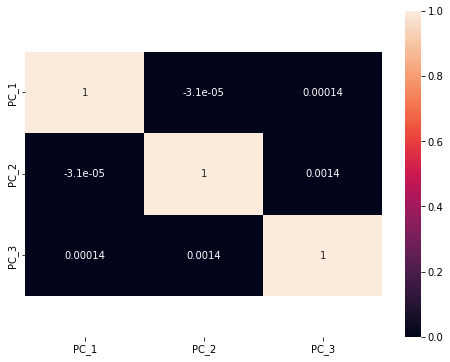

In [38]:
# Plotting Heatmap to check is there still dependency in the dataset.

plt.figure(figsize = (8,6))        
ax = sns.heatmap(df_pca_final.corr(),annot = True)
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

**Inference:**
As we can see from above heatmap that the correlation among the attributes is almost 0, we can proceed with this dataframe.

<AxesSubplot:xlabel='PC_3', ylabel='PC_2'>

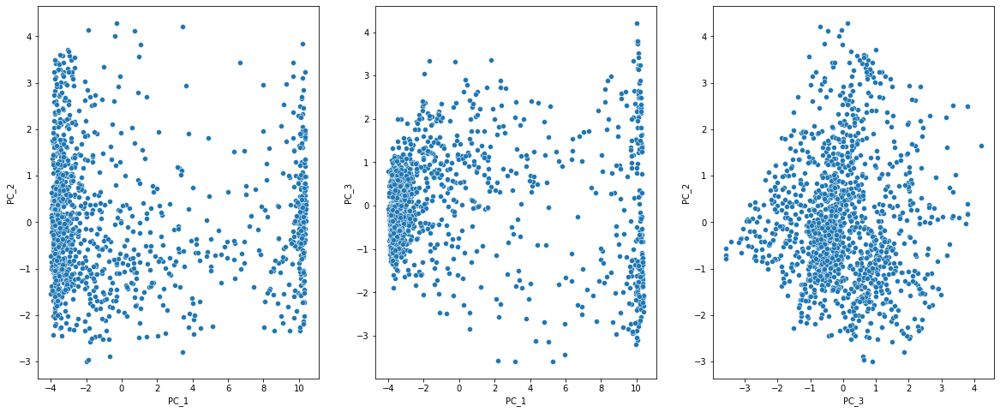

In [39]:
# Scatter Plot to visualize the spread of data across PCA components

plt.figure(figsize=(20, 8))
plt.subplot(1,3,1)
sns.scatterplot(data=df_pca_final, x='PC_1', y='PC_2')
plt.subplot(1,3,2)
sns.scatterplot(data=df_pca_final, x='PC_1', y='PC_3')
plt.subplot(1,3,3)
sns.scatterplot(data=df_pca_final, x='PC_3', y='PC_2')

Text(0.5, 0, 'Z-PC_3')

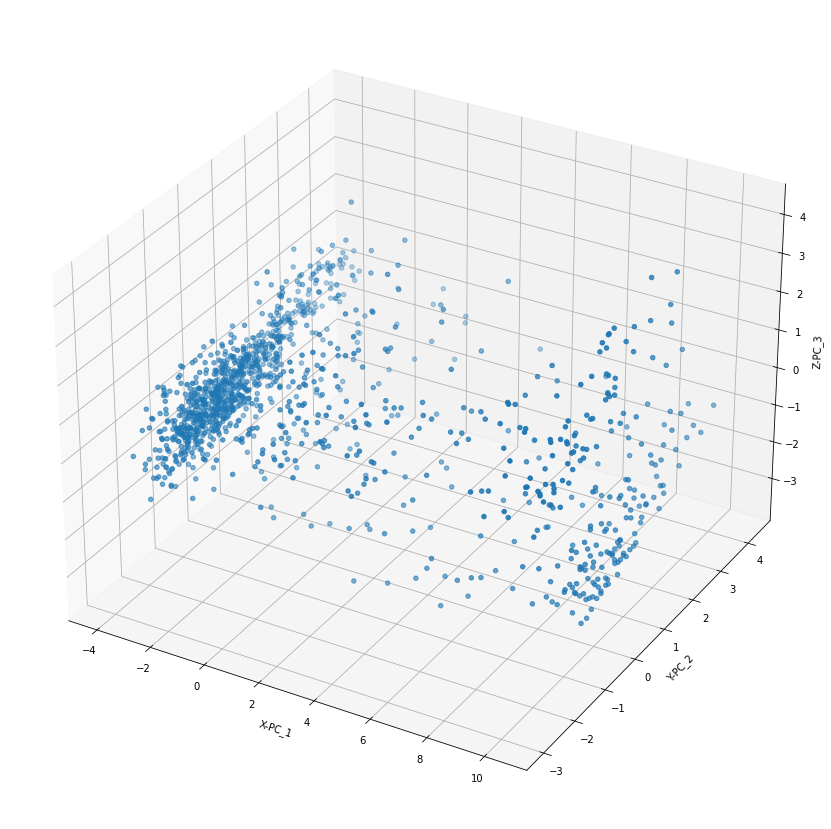

In [40]:
# Scatter 3d Plot to visualize the spread of data across PCA components

fig = plt.figure(figsize=(20,15))
ax = fig.add_subplot(projection='3d')
ax.scatter(df_pca_final["PC_1"], df_pca_final["PC_2"], df_pca_final["PC_3"], marker='o' )
ax.set_xlabel('X-PC_1')
ax.set_ylabel('Y-PC_2')
ax.set_zlabel('Z-PC_3')

In [41]:
df_pca_final_data = df_pca
len(df_pca_final_data)

1300


# Step 6 : Model Building

**K- means Clustering**
<br>
K-means clustering is one of the simplest and popular unsupervised machine learning algorithms.


**Finding the Optimal Number of Clusters**

Elbow Curve to get the right number of Clusters
A fundamental step for any unsupervised algorithm is to determine the optimal number of clusters into which the data may be clustered. The Elbow Method is one of the most popular methods to determine this optimal value of k.

Text(0.5, 1.0, 'Inertie vs nombre de classes')

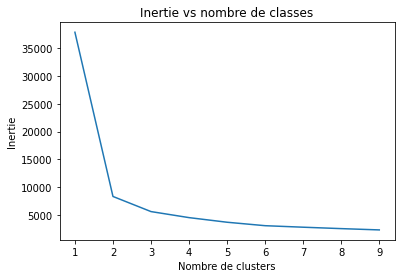

In [42]:
# Elbow curve method to find the ideal number of clusters.
inerties = []
for num_clusters in range(1,10):
    model_clus = KMeans(n_clusters = num_clusters)
    model_clus.fit_transform(df_pca_final_data)
    inerties.append(model_clus.inertia_)

plt.plot(range(1,10),inerties)
plt.xlabel("Nombre de clusters")
plt.ylabel("Inertie")
plt.title('Inertie vs nombre de classes')

**Inference:**
Looking at the above elbow curve it looks good to proceed with either 3 or 4 clusters.



**Silhouette Analysis**
 
The value of the silhouette score range lies between -1 to 1.

A score closer to 1 indicates that the data point is very similar to other data points in the cluster,

A score closer to -1 indicates that the data point is not similar to the data points in its cluster.

In [43]:
# Silhouette score analysis to find the ideal number of clusters for K-means clustering

range_n_clusters = [3, 4, 5, 6, 7, 8]

for num_clusters in range_n_clusters:
    
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters,random_state= 100)
    kmeans.fit(df_pca_final_data)
    y_pred = kmeans.predict(df_pca_final_data)
    
    # silhouette score
    silhouette_avg = silhouette_score(df_pca_final_data, y_pred, metric='euclidean')
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

For n_clusters=3, the silhouette score is 0.5492720172652508
For n_clusters=4, the silhouette score is 0.42014121473885935
For n_clusters=5, the silhouette score is 0.3910043246266914
For n_clusters=6, the silhouette score is 0.4138583953708349
For n_clusters=7, the silhouette score is 0.3302727971305338
For n_clusters=8, the silhouette score is 0.3350367344009034


Looking at the silhouette_score it looks good to proceed with either 3 .

In [44]:
#K-means with k=3 clusters

cluster3 = KMeans(n_clusters=3, random_state= 100)
cluster3.fit(df_pca_final_data)

KMeans(n_clusters=3, random_state=100)

In [45]:
# Cluster labels

cluster3.labels_

array([1, 2, 0, ..., 0, 0, 0], dtype=int32)

In [46]:
# Assign the label
# df_pca_final_data=df_pca_final_data.drop(['Cluster_Id3'], axis=1)
df_pca_final_data['Cluster_Id3'] = cluster3.labels_
df_pca_final_data.head()

,PC_1,PC_2,PC_3,Cluster_Id3
0,9.256459,-0.782957,-1.988294,1
1,4.034584,0.737837,-1.800924,2
2,-3.760216,-1.591816,-1.017371,0
3,-3.072429,-1.263134,-1.637748,0
4,-3.337293,-0.493191,-0.137271,0


In [47]:
# Number of region in each cluster

df_pca_final_data['Cluster_Id3'].value_counts()

0    845
1    256
2    199
Name: Cluster_Id3, dtype: int64

In [48]:
#cluster centers
centres = cluster3.cluster_centers_

<AxesSubplot:xlabel='PC_1', ylabel='PC_3'>

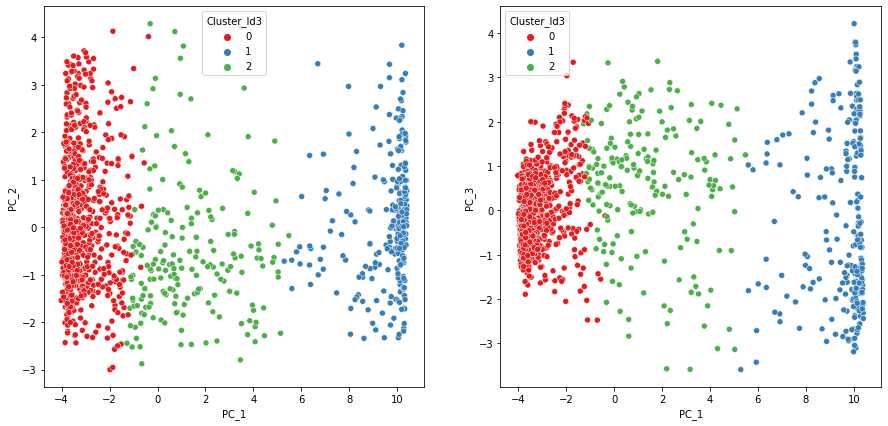

In [49]:
# Scatter plot on Principal components to visualize the spread of the data

fig, axes = plt.subplots(1,2, figsize=(15,7))

sns.scatterplot(x='PC_1',y='PC_2',hue='Cluster_Id3',legend='full',palette="Set1",data=df_pca_final_data,ax=axes[0])
sns.scatterplot(x='PC_1',y='PC_3',hue='Cluster_Id3',legend='full',palette="Set1",data=df_pca_final_data,ax=axes[1])

Text(0.5, 0, 'Z-PC_3')

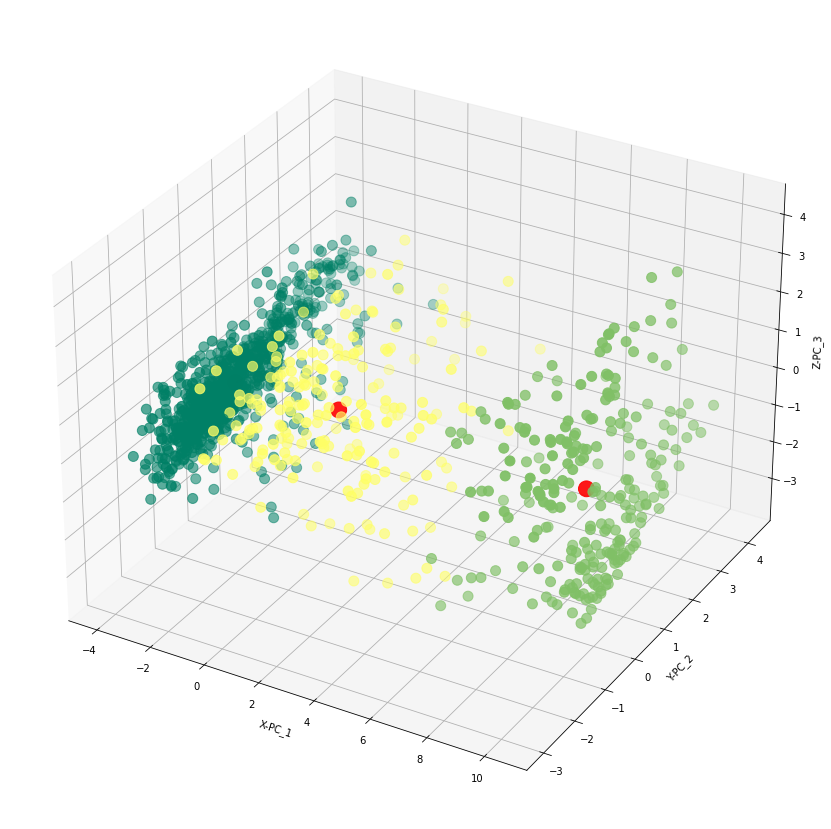

In [50]:

fig = plt.figure(figsize=(20,15))
ax = fig.add_subplot(projection='3d')
ax.scatter(df_pca_final["PC_1"], df_pca_final["PC_2"], df_pca_final["PC_3"], c = cluster3.labels_,cmap="summer",s=100, marker='o' )
ax.scatter(centres[:, 0], centres[:, 1], centres[:, 2],c='red', s=250, alpha=0.9 )
ax.set_xlabel('X-PC_1')
ax.set_ylabel('Y-PC_2')
ax.set_zlabel('Z-PC_3')

In [51]:
cha = AgglomerativeClustering().fit_predict(df_pca_final_data)

In [52]:
cha

array([1, 0, 0, ..., 0, 0, 0])

Text(0.5, 0, 'Z-PC_3')

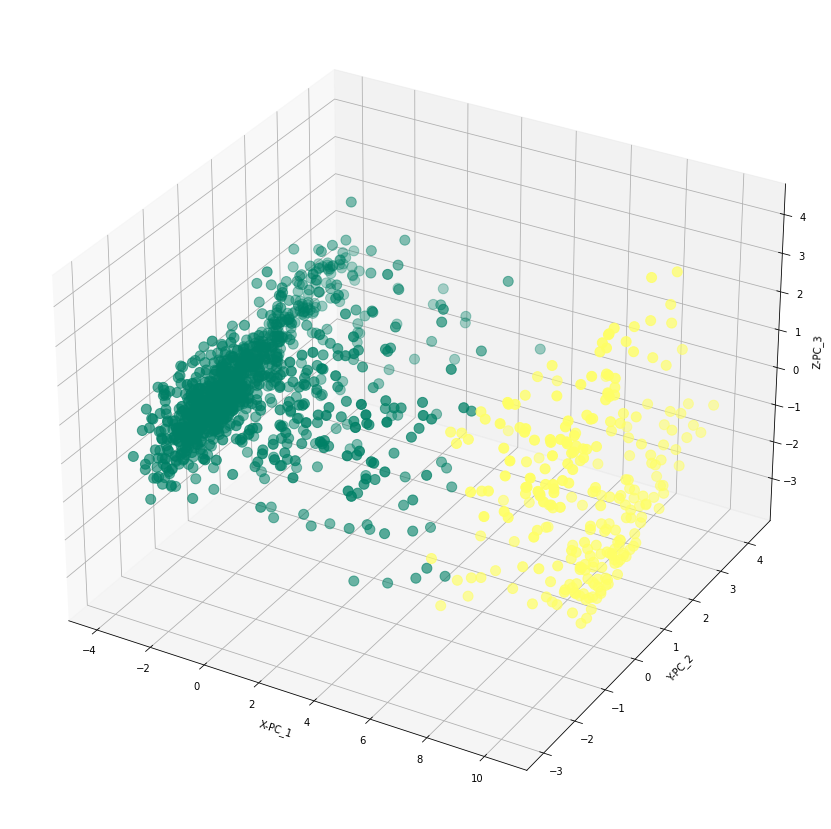

In [53]:
fig = plt.figure(figsize=(20,15))
ax = fig.add_subplot(projection='3d')
ax.scatter(df_pca_final["PC_1"], df_pca_final["PC_2"], df_pca_final["PC_3"], c = cha,cmap="summer",s=100, marker='o' )
ax.set_xlabel('X-PC_1')
ax.set_ylabel('Y-PC_2')
ax.set_zlabel('Z-PC_3')

**Single Linkage Clustering**

In single linkage hierarchical clustering, the distance between two clusters is defined as the shortest distance between two points in each cluster. 

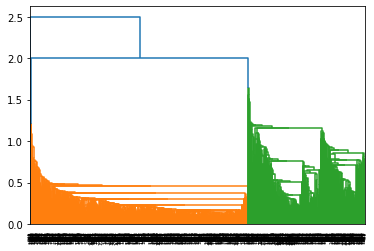

In [54]:
# Single linkage

mergings = linkage(df_pca_final_data, method='single',metric='euclidean')
dendrogram(mergings)
plt.show()

**Complete Linkage Clustering**

In complete linkage hierarchical clustering, the distance between two clusters is defined as the longest distance between two points in each cluster.

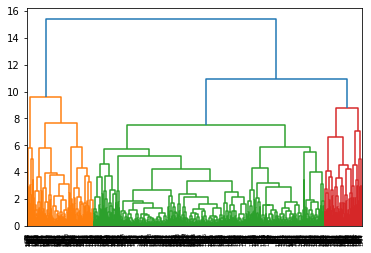

In [55]:
# Complete Linkage

mergings = linkage(df_pca_final_data, method='complete',metric='euclidean')
dendrogram(mergings)
plt.show()

**Average linkage clustering**

In Average linkage clustering, the distance between two clusters is defined as the average of distances between all pairs of objects, where each pair is made up of one object from each group. 

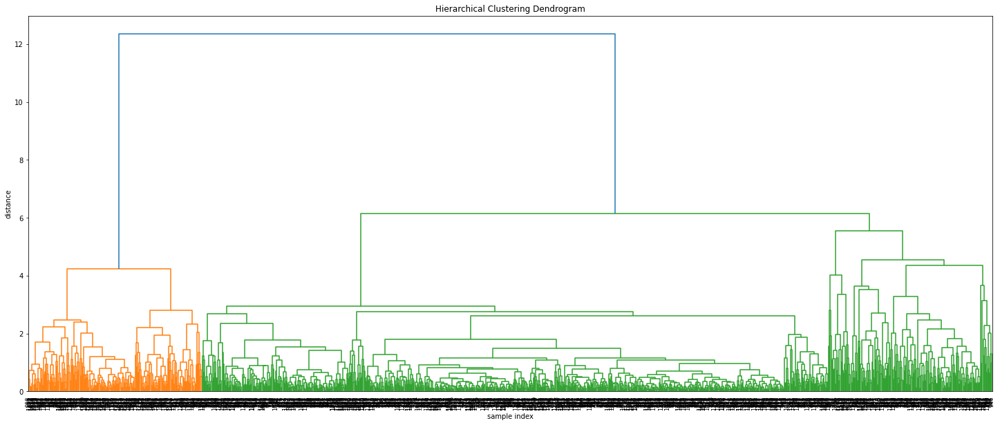

In [56]:
# average Linkage
Z = linkage(df_pca_final_data, 'average', metric='euclidean')
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
)
plt.show()

**CAH with 3 clusters.**

In [57]:
cha = AgglomerativeClustering(n_clusters=3).fit_predict(df_pca_final_data)

Text(0.5, 0, 'Z-PC_3')

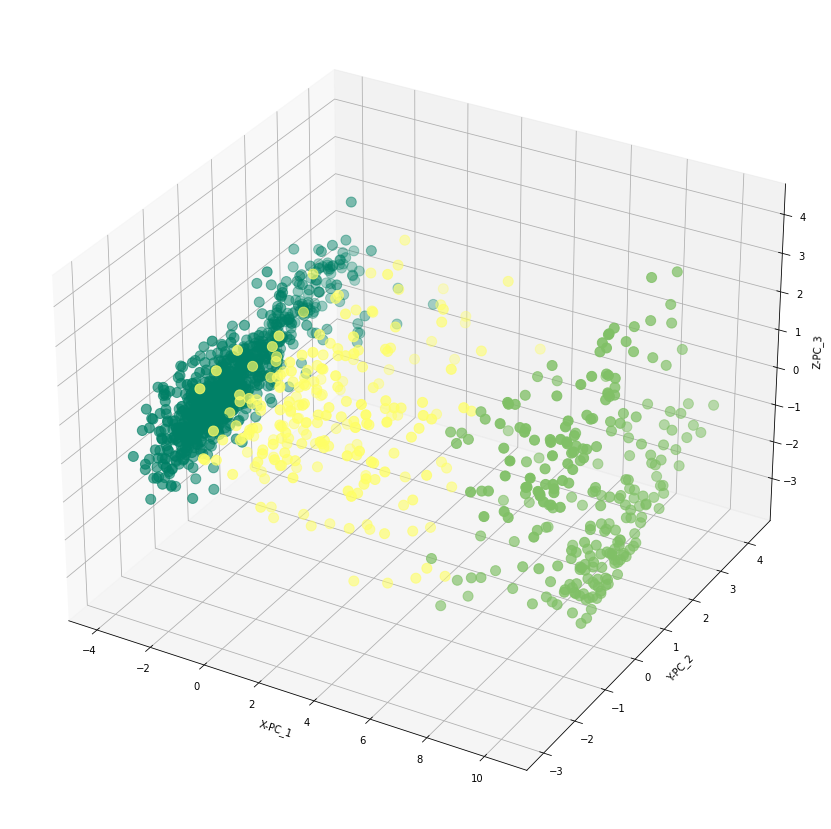

In [58]:
fig = plt.figure(figsize=(20,15))
ax = fig.add_subplot(projection='3d')
ax.scatter(df_pca_final_data["PC_1"], df_pca_final_data["PC_2"], df_pca_final_data["PC_3"], c = cha ,cmap="summer",s=100, marker='o' )
ax.set_xlabel('X-PC_1')
ax.set_ylabel('Y-PC_2')
ax.set_zlabel('Z-PC_3')

In [59]:
silhouette_score(df_pca_final_data, cha)

0.553184612146255

In [60]:
silhouette_score(df_pca_final_data, cluster3.labels_)

0.5792705006879777

**We have analyzed both K-means and Hierarchial clustering and found clusters formed are not really identical. The clusters formed in both the cases are not that great but its better in K-means as compared to Hierarchial.So, we will proceed with the clusters formed by K-means and based on the information provided by the final clusters we will visualize the data in the map**

#  Step 7 : Final Analysis

In [61]:
communes = pd.DataFrame(
    {
      'LIBGEO': dataset['LIBGEO'],
      'Latitude':dataset['Latitude'],
      'Longitude': dataset['Longitude'],
      'classe': cluster3.labels_,
    }
)
communes 

,LIBGEO,Latitude,Longitude,classe
0,Saint-Gratien,48.9695044801,2.28470111182,1
1,Pierrelaye,49.0190794714,2.1606870483,2
2,Saint-Cyr-en-Arthies,49.058878265,1.74176317637,0
3,La Roche-Guyon,49.0883415268,1.63442788467,0
4,Villiers-Adam,49.0697597649,2.23847351378,0
...,...,...,...,...
1295,Sannois,48.971575438,2.25336384763,1
1296,Saint-Leu-la-Forêt,49.0187947257,2.24666220276,1
1297,Villiers-le-Sec,49.0745767074,2.38634517834,0
1298,Théméricourt,49.0908194723,1.90500672567,0


In [62]:
# Calculating the Missing Values Pourcentage in rows
nullList=[]
for i in range(len(communes.index)) :
    nullList.append((i,communes.iloc[i].isnull().sum()))
    
# max(nullList,key=lambda item:item[1])
sorted(nullList,key=lambda item:item[1],reverse=True)[:15]

[(168, 2),
 (873, 2),
 (989, 2),
 (0, 0),
 (1, 0),
 (2, 0),
 (3, 0),
 (4, 0),
 (5, 0),
 (6, 0),
 (7, 0),
 (8, 0),
 (9, 0),
 (10, 0),
 (11, 0)]

In [63]:
communes = communes.drop([168,873,989],axis=0)

In [64]:

# Create a map
color = ""
m = folium.Map(location=[48.7, 2.454], tiles='openstreetmap', zoom_start=8.5)

# Add points to the map
for idx, row in communes.iterrows():
    if row['classe'] == 0:
        color =  'crimson'
    elif row['classe'] == 1:
        color = 'green'
    else:
        color = 'blue'
    folium.Circle([row['Latitude'], row['Longitude']], popup=row['LIBGEO'] , color=color,fill=True,radius=240).add_to(m)

m

In [65]:
# import folium

# # Create a map
# m = folium.Map(location=[48.7, 2.454], tiles='openstreetmap', zoom_start=8.5)

# # Set up Choropleth map
# folium.Choropleth(
#         geo_data=communes,
#         data=communes,
#         columns=['CODGEO',"classe"],
#         key_on="feature.properties.CODGEO",
#         fill_color='YlGnBu',
#         fill_opacity=1,
#         line_opacity=0.2,
#         legend_name="classe",
#         smooth_factor=0,
#         Highlight= True,
#         line_color = "#0000",
#         name = "classe",
#         show=False,
#         overlay=True,
#         nan_fill_color = "White"
# ).add_to(m)

# m